In [1]:
# import libraries

import gc
import pandas_profiling

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.feature_selection import mutual_info_regression
from sklearn.model_selection import GridSearchCV

### Data Import

In [2]:
fifaraw = pd.read_csv("Data/Fifa2019.csv")
fifaraw.head(10)

,Unnamed: 0,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,...,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
0,0,158023,L. Messi,31,https://cdn.sofifa.org/players/4/19/158023.png,Argentina,https://cdn.sofifa.org/flags/52.png,94,94,FC Barcelona,...,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,€226.5M
1,1,20801,Cristiano Ronaldo,33,https://cdn.sofifa.org/players/4/19/20801.png,Portugal,https://cdn.sofifa.org/flags/38.png,94,94,Juventus,...,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,€127.1M
2,2,190871,Neymar Jr,26,https://cdn.sofifa.org/players/4/19/190871.png,Brazil,https://cdn.sofifa.org/flags/54.png,92,93,Paris Saint-Germain,...,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,€228.1M
3,3,193080,De Gea,27,https://cdn.sofifa.org/players/4/19/193080.png,Spain,https://cdn.sofifa.org/flags/45.png,91,93,Manchester United,...,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,€138.6M
4,4,192985,K. De Bruyne,27,https://cdn.sofifa.org/players/4/19/192985.png,Belgium,https://cdn.sofifa.org/flags/7.png,91,92,Manchester City,...,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,€196.4M
5,5,183277,E. Hazard,27,https://cdn.sofifa.org/players/4/19/183277.png,Belgium,https://cdn.sofifa.org/flags/7.png,91,91,Chelsea,...,91.0,34.0,27.0,22.0,11.0,12.0,6.0,8.0,8.0,€172.1M
6,6,177003,L. Modrić,32,https://cdn.sofifa.org/players/4/19/177003.png,Croatia,https://cdn.sofifa.org/flags/10.png,91,91,Real Madrid,...,84.0,60.0,76.0,73.0,13.0,9.0,7.0,14.0,9.0,€137.4M
7,7,176580,L. Suárez,31,https://cdn.sofifa.org/players/4/19/176580.png,Uruguay,https://cdn.sofifa.org/flags/60.png,91,91,FC Barcelona,...,85.0,62.0,45.0,38.0,27.0,25.0,31.0,33.0,37.0,€164M
8,8,155862,Sergio Ramos,32,https://cdn.sofifa.org/players/4/19/155862.png,Spain,https://cdn.sofifa.org/flags/45.png,91,91,Real Madrid,...,82.0,87.0,92.0,91.0,11.0,8.0,9.0,7.0,11.0,€104.6M
9,9,200389,J. Oblak,25,https://cdn.sofifa.org/players/4/19/200389.png,Slovenia,https://cdn.sofifa.org/flags/44.png,90,93,Atlético Madrid,...,70.0,27.0,12.0,18.0,86.0,92.0,78.0,88.0,89.0,€144.5M


In [19]:
# create data profile
pandas_profiling.ProfileReport(fifaraw)

### Data Cleansing

There are some columns whihc either do not carry any value for analysis or we will not be exploring them in the scope of this project. 

#### Removing redundant columns
* The first column looks redundant as it only has some idex numbers.
* The images contained in the URL in the Photo and Flag field are not required for this analysis.
* The Loaned From column is very sparingly populated and does not seem to be of great significance.

In [117]:
fifaclean = fifaraw.drop(['Unnamed: 0','Flag','Photo','Club Logo','Loaned From'],axis=1)

#### Handling null values

The pandas profile exposed a few concerns regarding null values in various fields. Let us concentrate on those fields and handle the null values.

In [118]:
fifaclean.columns[fifaclean.isna().any()].tolist()

['Club',
 'Preferred Foot',
 'International Reputation',
 'Weak Foot',
 'Skill Moves',
 'Work Rate',
 'Body Type',
 'Real Face',
 'Position',
 'Jersey Number',
 'Joined',
 'Contract Valid Until',
 'Height',
 'Weight',
 'LS',
 'ST',
 'RS',
 'LW',
 'LF',
 'CF',
 'RF',
 'RW',
 'LAM',
 'CAM',
 'RAM',
 'LM',
 'LCM',
 'CM',
 'RCM',
 'RM',
 'LWB',
 'LDM',
 'CDM',
 'RDM',
 'RWB',
 'LB',
 'LCB',
 'CB',
 'RCB',
 'RB',
 'Crossing',
 'Finishing',
 'HeadingAccuracy',
 'ShortPassing',
 'Volleys',
 'Dribbling',
 'Curve',
 'FKAccuracy',
 'LongPassing',
 'BallControl',
 'Acceleration',
 'SprintSpeed',
 'Agility',
 'Reactions',
 'Balance',
 'ShotPower',
 'Jumping',
 'Stamina',
 'Strength',
 'LongShots',
 'Aggression',
 'Interceptions',
 'Positioning',
 'Vision',
 'Penalties',
 'Composure',
 'Marking',
 'StandingTackle',
 'SlidingTackle',
 'GKDiving',
 'GKHandling',
 'GKKicking',
 'GKPositioning',
 'GKReflexes',
 'Release Clause']

In [119]:
# filling the missing value for only the continous variables for proper data analysis
# filling with the corresponding mean values
fifaclean['ShortPassing'].fillna(fifaclean['ShortPassing'].mean(), inplace = True)
fifaclean['Volleys'].fillna(fifaclean['Volleys'].mean(), inplace = True)
fifaclean['Dribbling'].fillna(fifaclean['Dribbling'].mean(), inplace = True)
fifaclean['Curve'].fillna(fifaclean['Curve'].mean(), inplace = True)
fifaclean['FKAccuracy'].fillna(fifaclean['FKAccuracy'].mean(), inplace = True)
fifaclean['LongPassing'].fillna(fifaclean['LongPassing'].mean(), inplace = True)
fifaclean['BallControl'].fillna(fifaclean['BallControl'].mean(), inplace = True)
fifaclean['HeadingAccuracy'].fillna(fifaclean['HeadingAccuracy'].mean(), inplace = True)
fifaclean['Finishing'].fillna(fifaclean['Finishing'].mean(), inplace = True)
fifaclean['Crossing'].fillna(fifaclean['Crossing'].mean(), inplace = True)

# filling discreate values with the closest logical possibilities

fifaclean['Weight'].fillna('200lbs', inplace = True)
fifaclean['Height'].fillna("5'11", inplace = True)
fifaclean['Joined'].fillna('Jul 1, 2018', inplace = True)
fifaclean['Jersey Number'].fillna(8, inplace = True)
fifaclean['Position'].fillna('ST', inplace = True)
fifaclean['Club'].fillna('No Club', inplace = True)
fifaclean['Work Rate'].fillna('Medium/ Medium', inplace = True)
fifaclean['Skill Moves'].fillna(fifaclean['Skill Moves'].median(), inplace = True)
fifaclean['Weak Foot'].fillna(3, inplace = True)
fifaclean['Preferred Foot'].fillna('Right', inplace = True)
fifaclean['International Reputation'].fillna(1, inplace = True)
fifaclean['Body Type'].fillna('Normal', inplace = True)

# replacing the single body types with the stocky body types

fifaclean['Body Type'].replace('Messi', 'Stocky', inplace = True)
fifaclean['Body Type'].replace('C. Ronaldo', 'Stocky', inplace = True)
fifaclean['Body Type'].replace('Courtois', 'Stocky', inplace = True)
fifaclean['Body Type'].replace('PLAYER_BODY_TYPE_25', 'Stocky', inplace = True)
fifaclean['Body Type'].replace('Shaqiri', 'Stocky', inplace = True)
fifaclean['Body Type'].replace('Neymar', 'Stocky', inplace = True)
fifaclean['Body Type'].replace('Akinfenwa', 'Stocky',inplace = True)

#### Convert height to inch

In [120]:
def parse_ht(ht):
    '''
    Args: Height in format 7'5
    Output: Height in inch, format 84.35
    
    Converts height from string (ft'inch) to float
    '''
    
    ht_ = ht.split("'")
    ft_ = float(ht_[0])
    in_ = float(ht_[1].replace("\"",""))
    return (12*ft_) + in_

fifaclean['Height_inch'] = fifaclean['Height'].apply(lambda x:parse_ht(x))

#### Convert weight to int pound

In [121]:
def parse_wht(wt):
    '''
    Args: Wight in format 120lbs (string)
    Output: Weight in pounds (float)
    
    Converts weight from string to float
    '''
    
    wt_ = wt.split("l")
    wt_ = float(wt_[0])
    return wt_

fifaclean['Weight_lb'] = fifaclean['Weight'].apply(lambda x:parse_wt(x))

In [122]:
#  remove redundant columns
coldrop = ['Height', 'Weight']
fifaclean = fifaclean.drop(coldrop, axis=1)

#### Handling currency
Since the entire dataset has Euro as currency, it does not make sense to convert them to dollar. But we still need to handle the currency symbols and units. Given the range of values, it makes sense to convert everything to thousands (euro).

In [124]:
# Standardize currency values
fifaclean['Value_kEuro'] = pd.to_numeric(fifaclean['Value'].\
                                         str.replace('€','').\
                                         str.replace('M','000').\
                                         str.replace('K',''))

fifaclean['Wage_kEuro'] = pd.to_numeric(fifaclean['Wage'].\
                                        str.replace('€','').\
                                        str.replace('M','000').\
                                        str.replace('K',''))

fifaclean['ReleaseClaus_kEuro'] = pd.to_numeric(fifaclean['Release Clause'].\
                                                str.replace('€','').\
                                                str.replace('M','000').\
                                                str.replace('K',''))

# Remove redundant columns
fifaclean.drop(['Value','Wage','Release Clause'],axis=1,inplace=True)

# Check dataframe
fifaclean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18207 entries, 0 to 18206
Data columns (total 84 columns):
ID                          18207 non-null int64
Name                        18207 non-null object
Age                         18207 non-null int64
Nationality                 18207 non-null object
Overall                     18207 non-null int64
Potential                   18207 non-null int64
Club                        18207 non-null object
Special                     18207 non-null int64
Preferred Foot              18207 non-null object
International Reputation    18207 non-null float64
Weak Foot                   18207 non-null float64
Skill Moves                 18207 non-null float64
Work Rate                   18207 non-null object
Body Type                   18207 non-null object
Real Face                   18159 non-null object
Position                    18207 non-null object
Jersey Number               18207 non-null float64
Joined                      18207 non-null

### Exploratory Data Analysis

To get familiarized with the dataset, let us answer some descriptive questions.

**1. Which are the major football playing nations?**

To answer this question, let us see what countries most of the players are from. We would be looking at the top 5 countries, to keep the graph clean.

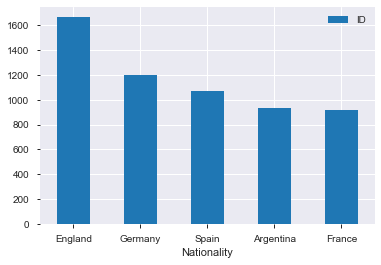

In [125]:
fifanations = fifaclean.groupby('Nationality').\
    count()[['ID']].\
    sort_values(by=['ID'], ascending=False).\
    head(5)

fifanations.plot.bar(rot=0)

English Premier League, being one of the biggest football leagues in the world, involve most players from England. Bundeshlega and Spanish La Liga are not far behind. Argentine players are playing all over the world. Therefore, Argentina is also in the list.

**2. Which are the richest clubs in terms of spending power?**

First, let us take a look at the average spending by the clubs.

In [126]:
fifaclean['Wage_kEuro'].mean()

9.731312132696216

i.e. a player on an average makes 9.73k Euro for a year. This will help us understand where the big spenders stand in terms of wages. In terms of total wages, the lising looks as follows:

In [127]:
# calculate total wages paid by the club
clubwage = fifaclean.\
    groupby('Club').\
    sum()[['Wage_kEuro']].\
    reset_index().\
    sort_values(by=['Wage_kEuro'], ascending=False)
    

clubwage.head(10)

,Club,Wage_kEuro
471,Real Madrid,5017
212,FC Barcelona,4837
374,Manchester City,3741
375,Manchester United,3391
326,Juventus,3292
134,Chelsea,3249
363,Liverpool,2902
584,Tottenham Hotspur,2623
52,Arsenal,2588
214,FC Bayern München,2286


Does these big spenders pay more or do they have a larger pool? An average payment statistics will uncover that.

In [128]:
# Claculate plyer pool size of the club
clubpoosize = fifaclean.\
    groupby('Club').\
    count()[['ID']].\
    reset_index()

# calculate average wage paid per player
clubcombo = pd.merge(clubwage, clubpoosize, how='inner', on = 'Club')
clubcombo['Average Wage'] = clubcombo['Wage_kEuro']/clubcombo['ID']
clubavgwage = clubcombo.drop(columns=['Wage_kEuro', 'ID'], axis=1)

clubavgwage.\
    sort_values(by='Average Wage', ascending=False).\
    head(10)

,Club,Average Wage
0,Real Madrid,152.030303
1,FC Barcelona,146.575758
4,Juventus,131.680000
2,Manchester City,113.363636
3,Manchester United,102.757576
5,Chelsea,98.454545
6,Liverpool,87.939394
7,Tottenham Hotspur,79.484848
9,FC Bayern München,78.827586
8,Arsenal,78.424242


Interestingly, there are no new clubs, but some ups and downs among the top 10 clubs. We can conclude that the average wage of these big spenders are significantly above the overall average (9.73k Euro).

**3. What is the age distribution of the players?**

This analysis try to discover what is the peak age of a player in terms of activity and what is any retirement age range.

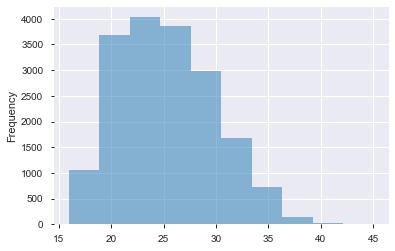

In [129]:
fifaclean['Age'].plot.hist(bins=10, alpha=0.5)

As expected, majority of the players are between 19 to 31 years of age. 24 being the most frequent age of players. A noticeable drop at age 34-35 signifies that players usually retire at that age, though there are instances of 40 year old players. 

**4. Correlation between Player’s Age, Overall potential, Value and Wage**

To get an overall picture of how players are rated and paid, let us plot correlation between the age of a player, their overall capability and their remunerations.

In [130]:
fifaclean[['Age', 'Potential', 'Value_kEuro', 'Wage_kEuro']].corr()

,Age,Potential,Value_kEuro,Wage_kEuro
Age,1.000000,-0.253312,0.048263,0.141145
Potential,-0.253312,1.000000,0.364553,0.486413
Value_kEuro,0.048263,0.364553,1.000000,0.603883
Wage_kEuro,0.141145,0.486413,0.603883,1.000000


There is a positive correlation of player's potential and their value or wages. But we are not sure at this point why Age and Potential are negatively correlated. Is it because their ability decreases with age? We cannot be sure at this point without further analysis.

### Model Building

With 89 variables, the exploration can continue to a much larger extent. Since the intent is to explore some models as well, let us shift focus to answer some of the more appealing questions, such as,

**Can we predict a player’s potential based on his skills?**

Before we get started with the model, let us check whether there is any close correlation. It is hard to interpret from the pandas profile so analyzing the specific variables.

In [123]:
fifaclean[['Potential', 'Value_kEuro', 'Wage_kEuro', 'Potential', 'Overall']].corr()

KeyError: "['Value_kEuro', 'Wage_kEuro'] not in index"

Since the other variables show significant correlation with potential, they should be removed from the target data set.

In [47]:
# target data
y = fifaclean['Potential']

# input dataset
X = fifaclean.drop(['Value_kEuro', 'Wage_kEuro', 'Potential', 'Overall'], axis=1)

# create test train split with a 80-20 split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=42)

I selected **Random Forest** over **SVM** as the algorithm to  apply on this data because SVM is a two class algorithm, whereas Ransom Forest is a multi class algorithm. The input dataset has variables of different class and types. Therefore, Random Forest will suit this problem more.

In [52]:
# create model
rf = RandomForestRegressor(n_estimators=200)

# fit data
rf.fit(X_train, y_train)

# apply model
#y_test_prd = rf.predict(X_test)

# print key results
#print(r2_score(y_test, y_test_prd))
#print(mean_squared_error(y_test, y_test_prd))

ValueError: could not convert string to float: 'H. Brockbank'